In [ ]:
import os


os.makedirs("/root/.kaggle", exist_ok=True)
!mv kaggle.json /root/.kaggle/

!chmod 600 /root/.kaggle/kaggle.json


!kaggle config view

Configuration values from /root/.kaggle
- username: snehaaas
- path: None
- proxy: None
- competition: None


In [ ]:
!kaggle datasets download -d spritan1/yolo-annotated-chestxray-8-object-detection

Dataset URL: https://www.kaggle.com/datasets/spritan1/yolo-annotated-chestxray-8-object-detection
License(s): MIT


In [ ]:
!unzip -q "/content/yolo-annotated-chestxray-8-object-detection.zip"

In [ ]:
import numpy as np
import pandas as pd
import os
!pip install ultralytics --quiet
!pip install -U ipywidgets --quiet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 32.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 2.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 98.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 81.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 55.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 882.0 kB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 71.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.8/139.8 kB 6.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2

In [ ]:
train_images_path = '/content/chestXray8_512/train/images'
val_images_path = '/content/chestXray8_512/val/images'

class_names = [
    "Atelectasis",
    "Cardiomegaly",
    "Effusion",
    "Infiltrate",
    "Nodule",
    "Mass",
    "Pneumonia",
    "Pneumothorax",
]

num_classes = len(class_names)

In [ ]:
yaml_content = f"""
train: {train_images_path}
val: {val_images_path}

nc: {num_classes}
names: {class_names}
"""

In [ ]:
yaml_file_path = 'data.yaml'

with open(yaml_file_path, 'w') as yaml_file:
    yaml_file.write(yaml_content)

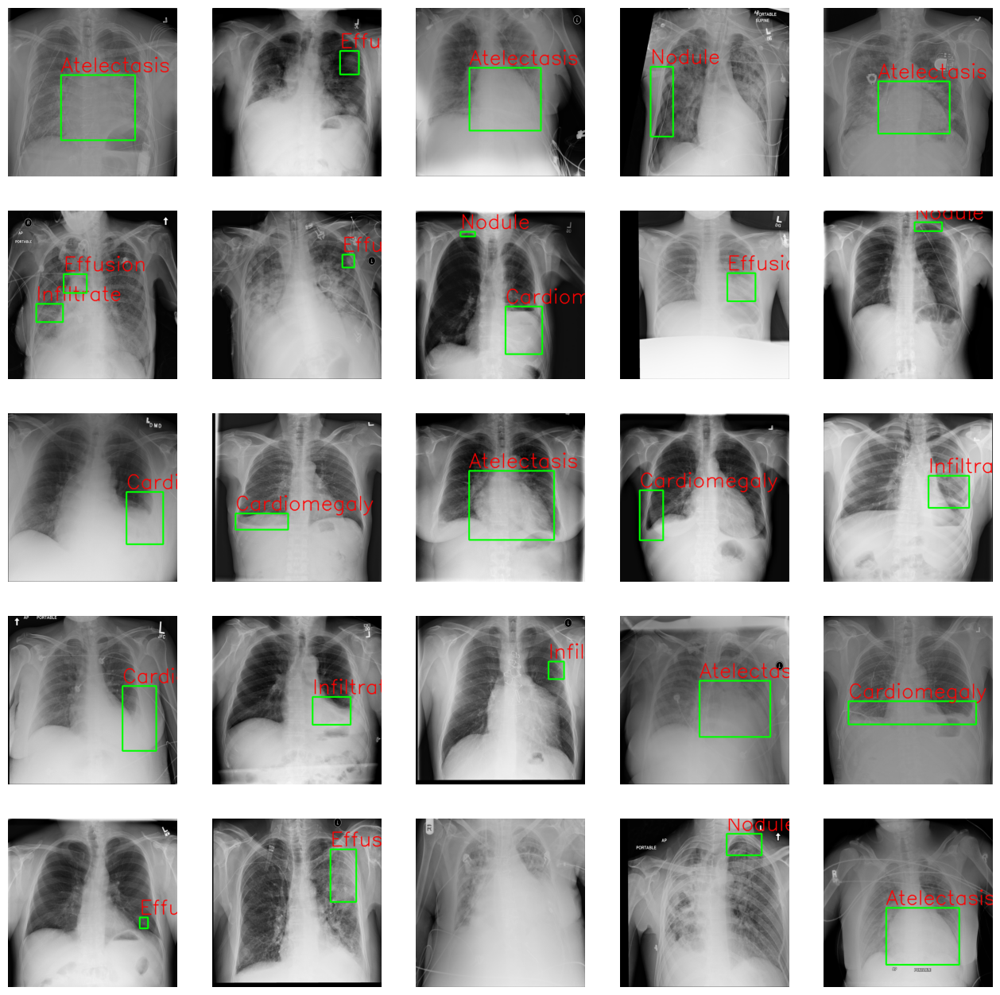

In [ ]:
import random
import cv2
import os
import matplotlib.pyplot as plt

image_dir = '/content/chestXray8_512/train/images'
image_files = os.listdir(image_dir)
random_image_file = random.choice(image_files)
img_path = os.path.join(image_dir, random_image_file)

random_images = random.sample(image_files,25)
label_files = '/content/chestXray8_512/train/labels'
fig, axs = plt.subplots(5,5, figsize=(16, 16))

for i, image_file in enumerate(random_images):
    row = i // 5
    col = i % 5
    image_path = os.path.join(image_dir, image_file)
    image = cv2.imread(image_path)

    label_file = os.path.splitext(image_file)[0] + ".txt"
    label_path = os.path.join(label_files, label_file)
    with open(label_path, "r") as f:
        labels = f.read().strip().split("\n")

    for label in labels:
        if len(label.split()) != 5:
            continue
        class_id, x_center, y_center, width, height = map(float, label.split())
        x_min = int((x_center - width/2) * image.shape[1])
        y_min = int((y_center - height/2) * image.shape[0])
        x_max = int((x_center + width/2) * image.shape[1])
        y_max = int((y_center + height/2) * image.shape[0])
        cv2.rectangle(image, (x_min, y_min), (x_max, y_max), (0, 255, 0), 3)
        classe=class_names[int(class_id)]
        cv2.putText(image, classe, (x_min, y_min - 10), cv2.FONT_HERSHEY_SIMPLEX, 2, (0, 0,255),2, cv2.LINE_AA)


    axs[row, col].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axs[row, col].axis('off')

plt.show()

In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 14.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 97.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 30.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 51.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 68.8 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling 

In [ ]:
from ultralytics import YOLO
model = YOLO("yolov8s.pt")

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


100%|██████████| 21.5M/21.5M [00:00<00:00, 118MB/s] 


In [ ]:
model.train(data="/content/data.yaml", epochs=40, imgsz=512)

Ultralytics 8.3.123 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/content/data.yaml, epochs=40, time=None, patience=100, batch=16, imgsz=512, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, line_width=None, f

train: Scanning /content/chestXray8_512/train/labels.cache... 631 images, 78 backgrounds, 0 corrupt: 100%|██████████| 631/631 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1100.0±741.6 MB/s, size: 98.1 KB)


val: Scanning /content/chestXray8_512/val/labels.cache... 159 images, 20 backgrounds, 0 corrupt: 100%|██████████| 159/159 [00:00<?, ?it/s]


Plotting labels to runs/detect/train2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000833, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 512 train, 512 val
Using 2 dataloader workers
Logging results to runs/detect/train2
Starting training for 40 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/40      2.98G      2.178      3.353      2.098         16        512: 100%|██████████| 40/40 [00:10<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.23it/s]

                   all        159        147      0.711      0.138      0.116     0.0571



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/40      3.02G      2.019      3.016      1.935         10        512: 100%|██████████| 40/40 [00:09<00:00,  4.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.84it/s]

                   all        159        147     0.0384      0.263      0.108     0.0471



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/40      3.04G      2.107      3.105      2.018         10        512: 100%|██████████| 40/40 [00:08<00:00,  4.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.84it/s]

                   all        159        147      0.255      0.154       0.07     0.0307



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/40      3.04G       2.13      3.064       2.05         12        512: 100%|██████████| 40/40 [00:08<00:00,  4.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.92it/s]

                   all        159        147     0.0131      0.525      0.028    0.00967



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/40      3.08G      2.112      3.108      1.986         12        512: 100%|██████████| 40/40 [00:08<00:00,  4.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.97it/s]

                   all        159        147      0.267      0.109     0.0422      0.017



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/40      3.08G      2.112      3.052      2.046         10        512: 100%|██████████| 40/40 [00:09<00:00,  4.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.60it/s]

                   all        159        147      0.517      0.126      0.105     0.0548



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/40      3.08G      2.082      3.015      2.057         12        512: 100%|██████████| 40/40 [00:09<00:00,  4.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.08it/s]

                   all        159        147      0.699     0.0923     0.0858     0.0316



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/40      3.08G      2.098      2.924      2.049         11        512: 100%|██████████| 40/40 [00:09<00:00,  4.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.84it/s]

                   all        159        147      0.733     0.0893     0.0946     0.0523



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/40      3.08G      1.986      2.829      1.955         14        512: 100%|██████████| 40/40 [00:08<00:00,  4.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.69it/s]

                   all        159        147      0.151      0.266      0.127     0.0568



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/40      3.08G      1.963      2.827      1.939         15        512: 100%|██████████| 40/40 [00:08<00:00,  4.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.19it/s]

                   all        159        147      0.471      0.159     0.0621     0.0333



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/40      3.08G      2.035      2.751      1.997         16        512: 100%|██████████| 40/40 [00:08<00:00,  4.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.17it/s]

                   all        159        147      0.709      0.195       0.15     0.0695



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/40      3.08G      1.952      2.764      1.953         17        512: 100%|██████████| 40/40 [00:09<00:00,  4.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.76it/s]

                   all        159        147      0.703      0.148      0.165       0.08



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/40      3.08G      1.893      2.608      1.924         10        512: 100%|██████████| 40/40 [00:09<00:00,  4.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.93it/s]

                   all        159        147      0.164      0.215      0.127     0.0643



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/40      3.11G      1.857       2.64      1.879          8        512: 100%|██████████| 40/40 [00:09<00:00,  4.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.95it/s]

                   all        159        147     0.0746      0.181      0.109      0.056



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/40      3.15G       1.86      2.533      1.874          8        512: 100%|██████████| 40/40 [00:09<00:00,  4.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.35it/s]

                   all        159        147       0.34      0.211      0.155     0.0668



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/40      3.19G       1.89       2.47      1.881         12        512: 100%|██████████| 40/40 [00:08<00:00,  4.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.62it/s]

                   all        159        147      0.182      0.279      0.126     0.0626



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/40       3.2G      1.825       2.44      1.863         13        512: 100%|██████████| 40/40 [00:08<00:00,  4.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.97it/s]

                   all        159        147      0.153      0.219      0.139     0.0759



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/40       3.2G      1.852      2.519       1.82         12        512: 100%|██████████| 40/40 [00:09<00:00,  4.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.02it/s]

                   all        159        147      0.519      0.171      0.136     0.0734



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/40       3.2G       1.76      2.365      1.798         13        512: 100%|██████████| 40/40 [00:09<00:00,  4.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.06it/s]

                   all        159        147      0.145      0.201      0.138     0.0732



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/40       3.2G      1.786      2.338      1.788          9        512: 100%|██████████| 40/40 [00:09<00:00,  4.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.55it/s]

                   all        159        147      0.146      0.244      0.127     0.0651



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/40       3.2G      1.762      2.306       1.79         11        512: 100%|██████████| 40/40 [00:09<00:00,  4.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.92it/s]

                   all        159        147      0.148      0.207      0.147     0.0794



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/40       3.2G      1.688      2.247      1.738          8        512: 100%|██████████| 40/40 [00:08<00:00,  4.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.72it/s]

                   all        159        147      0.244      0.138      0.132     0.0703



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/40       3.2G      1.664      2.197      1.704         12        512: 100%|██████████| 40/40 [00:08<00:00,  4.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.44it/s]

                   all        159        147      0.172       0.19      0.153     0.0747



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/40       3.2G      1.674      2.148      1.732         11        512: 100%|██████████| 40/40 [00:09<00:00,  4.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.07it/s]

                   all        159        147      0.194      0.285      0.198      0.103



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/40       3.2G      1.673      2.222      1.731         13        512: 100%|██████████| 40/40 [00:09<00:00,  4.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.63it/s]

                   all        159        147      0.118      0.303      0.166     0.0819



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/40       3.2G      1.614      2.087      1.684         10        512: 100%|██████████| 40/40 [00:09<00:00,  4.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.96it/s]

                   all        159        147       0.16      0.297      0.174      0.101



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/40       3.2G      1.644      2.082      1.688         14        512: 100%|██████████| 40/40 [00:09<00:00,  4.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.91it/s]

                   all        159        147      0.391      0.226      0.179      0.104



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/40       3.2G      1.596      1.962      1.664         10        512: 100%|██████████| 40/40 [00:08<00:00,  4.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.16it/s]

                   all        159        147      0.562      0.186      0.182      0.104



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/40       3.2G      1.512      1.901      1.624          4        512: 100%|██████████| 40/40 [00:08<00:00,  4.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.72it/s]

                   all        159        147       0.18      0.233      0.176      0.101



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/40       3.2G      1.527      1.963      1.627         10        512: 100%|██████████| 40/40 [00:08<00:00,  4.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.96it/s]

                   all        159        147      0.136       0.38      0.159     0.0889


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/40      3.22G      1.495      1.856      1.671          4        512: 100%|██████████| 40/40 [00:10<00:00,  3.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.02it/s]

                   all        159        147      0.141      0.229      0.151     0.0824



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/40      3.26G      1.479      1.707      1.651          5        512: 100%|██████████| 40/40 [00:09<00:00,  4.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.93it/s]

                   all        159        147      0.177      0.297      0.183      0.102



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/40      3.26G      1.419      1.653      1.629          7        512: 100%|██████████| 40/40 [00:08<00:00,  4.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.93it/s]

                   all        159        147      0.172      0.203      0.174     0.0949



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/40      3.26G      1.451      1.653      1.621          7        512: 100%|██████████| 40/40 [00:09<00:00,  4.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.08it/s]

                   all        159        147      0.175      0.296      0.175        0.1



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/40      3.26G      1.371      1.561      1.593          7        512: 100%|██████████| 40/40 [00:08<00:00,  4.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.21it/s]

                   all        159        147      0.171      0.296      0.177      0.102



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/40      3.26G      1.352      1.542      1.592          6        512: 100%|██████████| 40/40 [00:07<00:00,  5.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.58it/s]

                   all        159        147      0.184      0.294      0.192      0.108



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/40      3.26G       1.34      1.464      1.549          4        512: 100%|██████████| 40/40 [00:08<00:00,  4.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.02it/s]

                   all        159        147      0.169      0.261      0.188      0.106



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/40      3.26G      1.276      1.393      1.501          6        512: 100%|██████████| 40/40 [00:08<00:00,  4.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.03it/s]

                   all        159        147      0.178      0.299      0.187      0.104



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/40      3.26G      1.292      1.436      1.551          5        512: 100%|██████████| 40/40 [00:09<00:00,  4.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.05it/s]

                   all        159        147      0.208      0.269      0.191      0.108



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/40      3.26G      1.254      1.375      1.511          8        512: 100%|██████████| 40/40 [00:08<00:00,  4.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.79it/s]

                   all        159        147      0.207      0.306      0.192      0.106



40 epochs completed in 0.120 hours.
Optimizer stripped from runs/detect/train2/weights/last.pt, 22.5MB
Optimizer stripped from runs/detect/train2/weights/best.pt, 22.5MB

Validating runs/detect/train2/weights/best.pt...
Ultralytics 8.3.123 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 11,128,680 parameters, 0 gradients, 28.5 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.03it/s]


                   all        159        147      0.185      0.293      0.192      0.109
           Atelectasis         26         26      0.453      0.885      0.658      0.413
          Cardiomegaly         29         29      0.146      0.207     0.0758     0.0272
              Effusion         36         36      0.147      0.194      0.126     0.0734
            Infiltrate         36         36     0.0176     0.0278     0.0257    0.00734
                Nodule         20         20      0.162       0.15     0.0766     0.0224
Speed: 0.2ms preprocess, 2.9ms inference, 0.0ms loss, 4.3ms postprocess per image
Results saved to runs/detect/train2


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7940c0616690>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
        

In [ ]:
from shutil import copyfile
copyfile("runs/detect/train/weights/best.pt", "/content/yolov8_trained.pt")

'/content/yolov8_trained.pt'

In [ ]:

metrics = model.val(split='val')

print(f"Mean Average Precision @.5:.95 : {metrics.box.map}")
print(f"Mean Average Precision @ .50   : {metrics.box.map50}")
print(f"Mean Average Precision @ .70   : {metrics.box.map75}")
print("recall : ",metrics.box.r)
print(metrics.box.f1)
print(metrics.box.maps)

Ultralytics 8.3.123 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 11,128,680 parameters, 0 gradients, 28.5 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2516.6±914.5 MB/s, size: 98.1 KB)


val: Scanning /content/chestXray8_512/val/labels.cache... 159 images, 20 backgrounds, 0 corrupt: 100%|██████████| 159/159 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.09it/s]


                   all        159        147      0.169      0.309      0.189      0.107
           Atelectasis         26         26      0.409      0.885      0.657      0.409
          Cardiomegaly         29         29      0.162       0.31      0.076     0.0275
              Effusion         36         36      0.151      0.222      0.127     0.0741
            Infiltrate         36         36     0.0152     0.0278     0.0261    0.00731
                Nodule         20         20      0.107        0.1     0.0595     0.0176
Speed: 1.8ms preprocess, 6.8ms inference, 0.0ms loss, 1.5ms postprocess per image
Results saved to runs/detect/train22
Mean Average Precision @.5:.95 : 0.10715179461023921
Mean Average Precision @ .50   : 0.18900475246034604
Mean Average Precision @ .70   : 0.11073300532935312
recall :  [    0.88462     0.31034     0.22222    0.027778         0.1]
[    0.55911     0.21316      0.1798    0.019609     0.10328]
[     0.4093    0.027475    0.074065   0.0073122    0.

In [ ]:
best='/content/runs/detect/train/weights/best.pt'
model=YOLO(best)


image 1/1 /content/chestXray8_512/val/images/00023325_019.png: 512x512 1 Infiltrate, 11.1ms
Speed: 1.5ms preprocess, 11.1ms inference, 2.7ms postprocess per image at shape (1, 3, 512, 512)


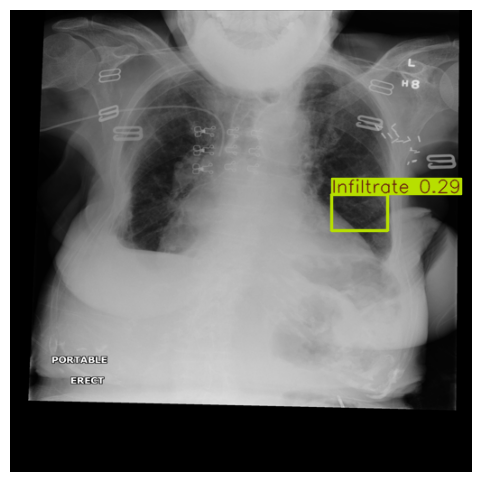


image 1/1 /content/chestXray8_512/val/images/00030674_000.png: 512x512 2 Atelectasiss, 12.2ms
Speed: 1.8ms preprocess, 12.2ms inference, 2.4ms postprocess per image at shape (1, 3, 512, 512)


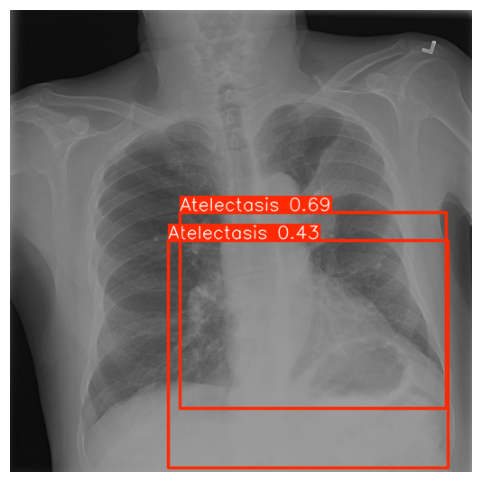


image 1/1 /content/chestXray8_512/val/images/00006851_033.png: 512x512 2 Atelectasiss, 24.7ms
Speed: 10.8ms preprocess, 24.7ms inference, 2.5ms postprocess per image at shape (1, 3, 512, 512)


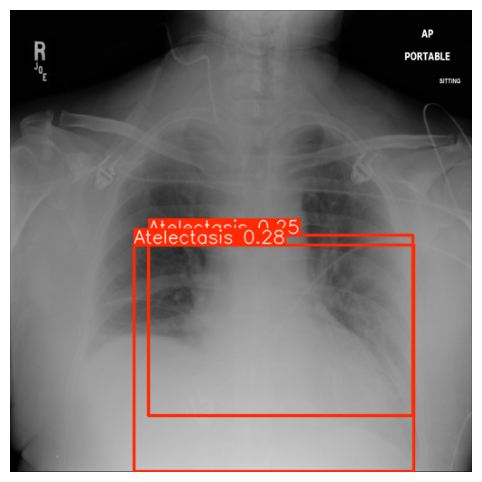


image 1/1 /content/chestXray8_512/val/images/00029579_014.png: 512x512 1 Atelectasis, 13.3ms
Speed: 5.6ms preprocess, 13.3ms inference, 2.0ms postprocess per image at shape (1, 3, 512, 512)


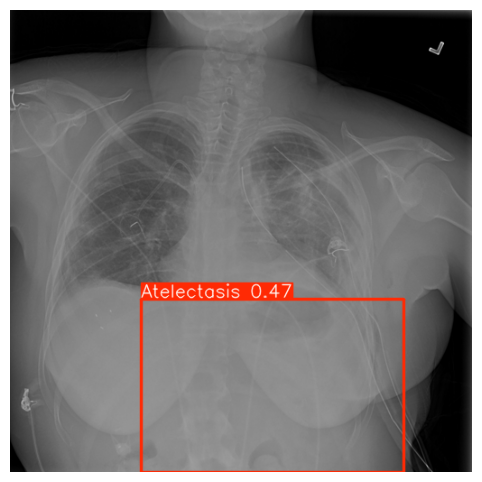


image 1/1 /content/chestXray8_512/val/images/00013977_005.png: 512x512 2 Atelectasiss, 28.0ms
Speed: 4.8ms preprocess, 28.0ms inference, 2.1ms postprocess per image at shape (1, 3, 512, 512)


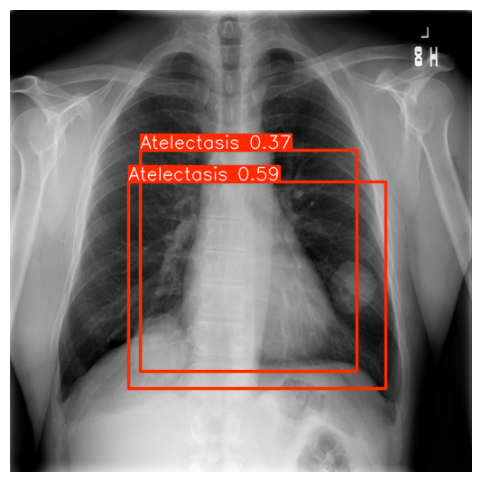


image 1/1 /content/chestXray8_512/val/images/00020857_008.png: 512x512 1 Atelectasis, 11.1ms
Speed: 1.7ms preprocess, 11.1ms inference, 2.1ms postprocess per image at shape (1, 3, 512, 512)


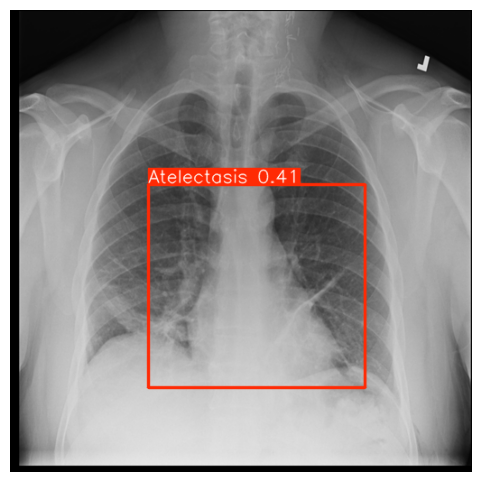


image 1/1 /content/chestXray8_512/val/images/00002578_000.png: 512x512 2 Atelectasiss, 1 Infiltrate, 11.1ms
Speed: 1.6ms preprocess, 11.1ms inference, 2.4ms postprocess per image at shape (1, 3, 512, 512)


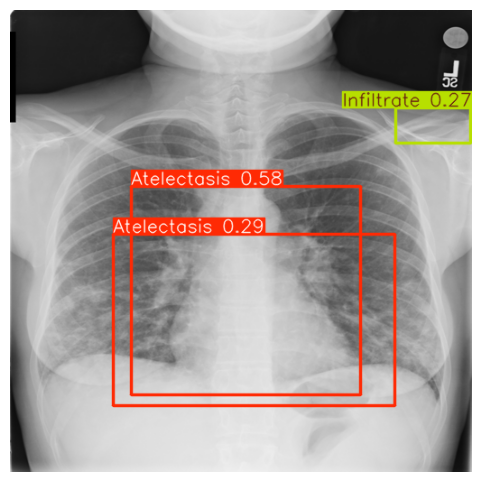


image 1/1 /content/chestXray8_512/val/images/00004968_004.png: 512x512 5 Atelectasiss, 11.1ms
Speed: 1.8ms preprocess, 11.1ms inference, 1.9ms postprocess per image at shape (1, 3, 512, 512)


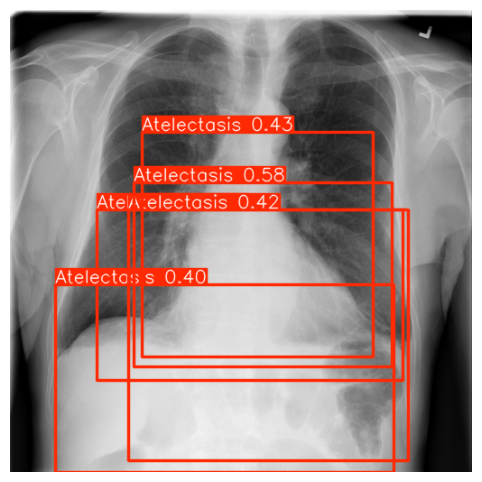


image 1/1 /content/chestXray8_512/val/images/00021796_000.png: 512x512 3 Atelectasiss, 6 Infiltrates, 11.1ms
Speed: 1.7ms preprocess, 11.1ms inference, 2.0ms postprocess per image at shape (1, 3, 512, 512)


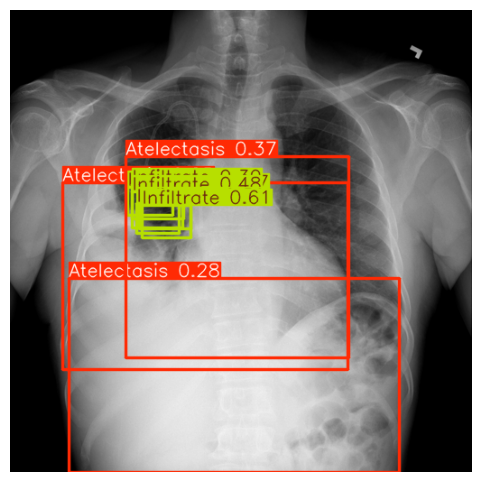


image 1/1 /content/chestXray8_512/val/images/00000052_001.png: 512x512 1 Atelectasis, 11.1ms
Speed: 3.1ms preprocess, 11.1ms inference, 2.0ms postprocess per image at shape (1, 3, 512, 512)


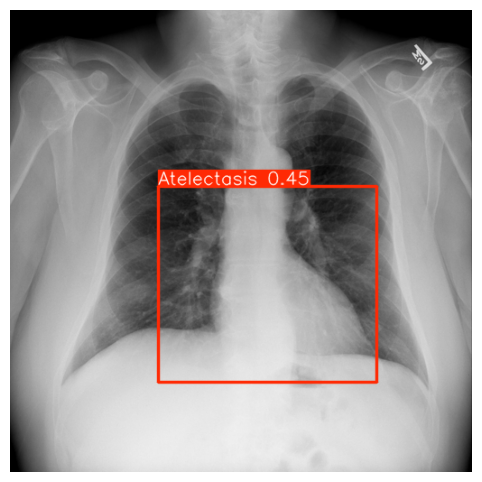


image 1/1 /content/chestXray8_512/val/images/00026886_002.png: 512x512 3 Atelectasiss, 11.7ms
Speed: 1.7ms preprocess, 11.7ms inference, 1.9ms postprocess per image at shape (1, 3, 512, 512)


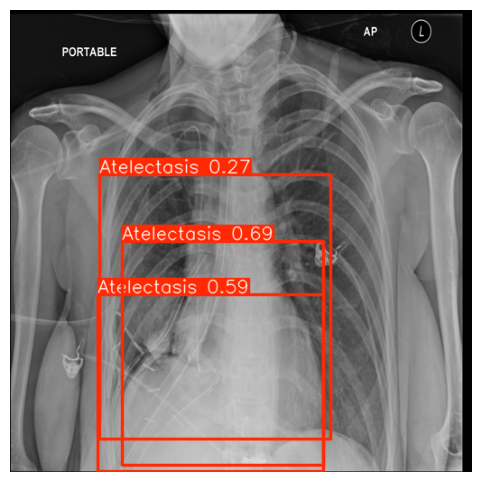


image 1/1 /content/chestXray8_512/val/images/00026920_000.png: 512x512 (no detections), 11.3ms
Speed: 1.8ms preprocess, 11.3ms inference, 0.9ms postprocess per image at shape (1, 3, 512, 512)


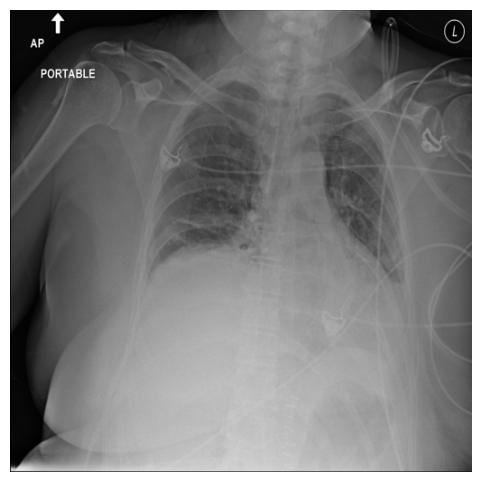


image 1/1 /content/chestXray8_512/val/images/00029843_001.png: 512x512 (no detections), 11.3ms
Speed: 1.6ms preprocess, 11.3ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 512)


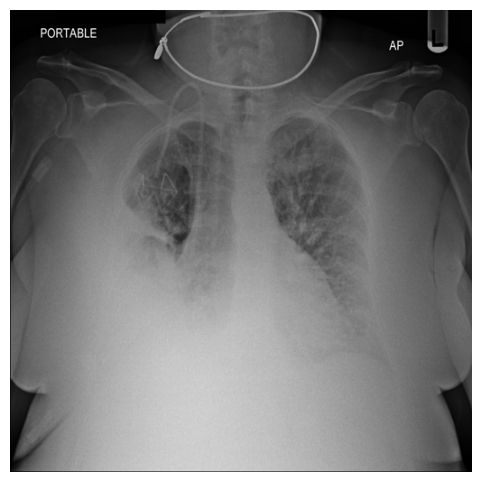


image 1/1 /content/chestXray8_512/val/images/00014976_003.png: 512x512 2 Atelectasiss, 12.0ms
Speed: 1.6ms preprocess, 12.0ms inference, 2.0ms postprocess per image at shape (1, 3, 512, 512)


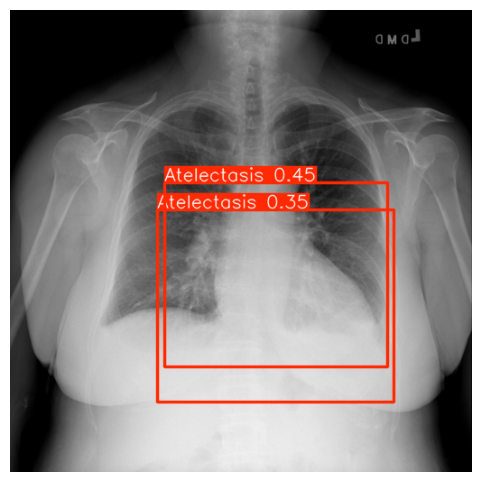


image 1/1 /content/chestXray8_512/val/images/00015792_005.png: 512x512 1 Atelectasis, 11.3ms
Speed: 2.0ms preprocess, 11.3ms inference, 2.1ms postprocess per image at shape (1, 3, 512, 512)


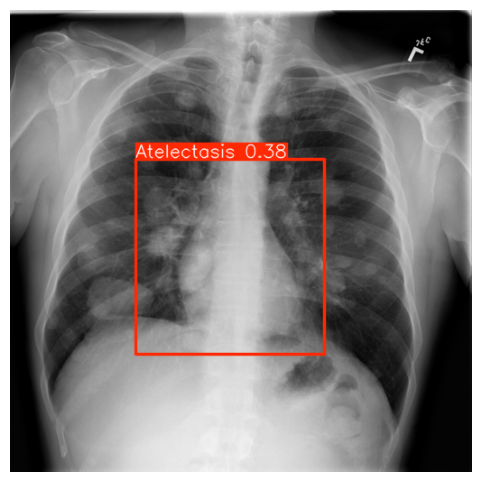


image 1/1 /content/chestXray8_512/val/images/00013685_000.png: 512x512 4 Atelectasiss, 11.1ms
Speed: 2.0ms preprocess, 11.1ms inference, 2.0ms postprocess per image at shape (1, 3, 512, 512)


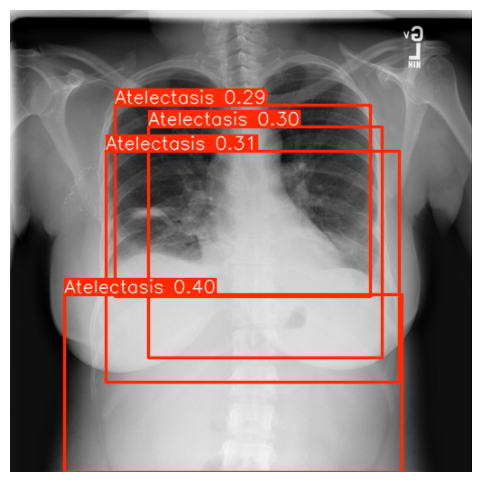


image 1/1 /content/chestXray8_512/val/images/00013125_000.png: 512x512 (no detections), 11.1ms
Speed: 1.7ms preprocess, 11.1ms inference, 0.9ms postprocess per image at shape (1, 3, 512, 512)


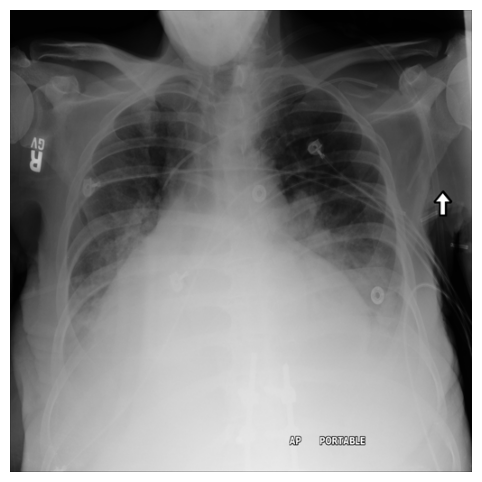


image 1/1 /content/chestXray8_512/val/images/00023068_003.png: 512x512 3 Atelectasiss, 11.1ms
Speed: 1.7ms preprocess, 11.1ms inference, 1.9ms postprocess per image at shape (1, 3, 512, 512)


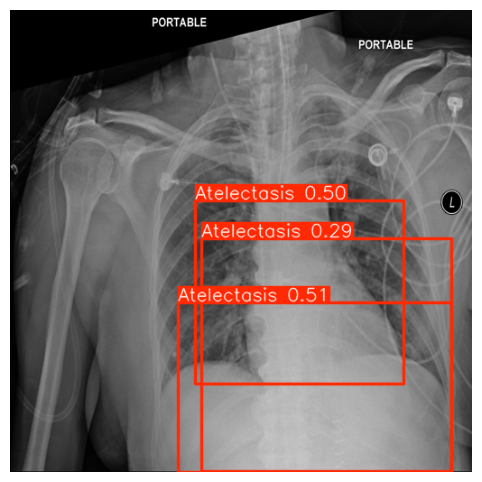


image 1/1 /content/chestXray8_512/val/images/00000048_000.png: 512x512 1 Atelectasis, 11.1ms
Speed: 1.6ms preprocess, 11.1ms inference, 2.0ms postprocess per image at shape (1, 3, 512, 512)


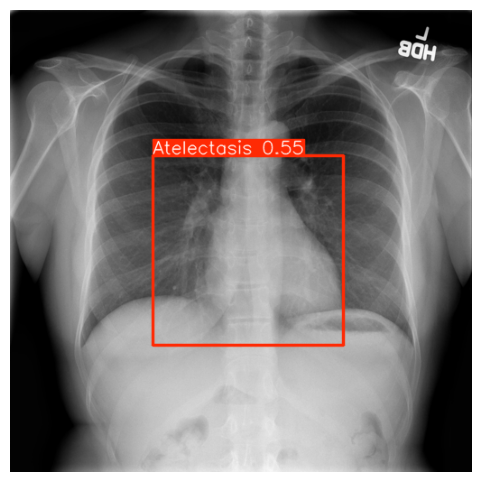


image 1/1 /content/chestXray8_512/val/images/00000865_006.png: 512x512 3 Atelectasiss, 11.2ms
Speed: 1.7ms preprocess, 11.2ms inference, 2.0ms postprocess per image at shape (1, 3, 512, 512)


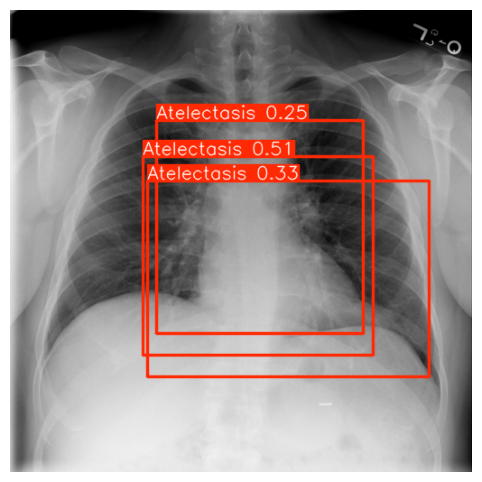


image 1/1 /content/chestXray8_512/val/images/00013249_052.png: 512x512 (no detections), 15.0ms
Speed: 1.7ms preprocess, 15.0ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 512)


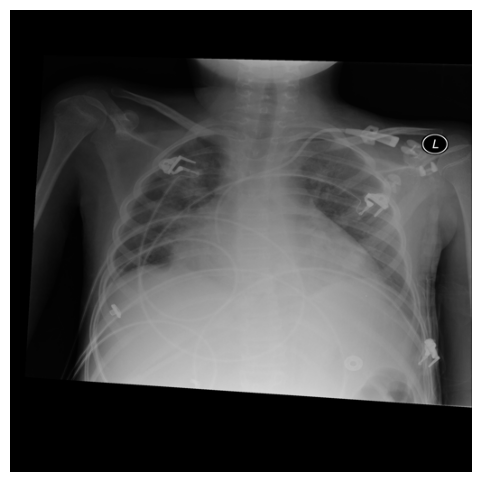


image 1/1 /content/chestXray8_512/val/images/00016587_069.png: 512x512 1 Atelectasis, 11.1ms
Speed: 1.8ms preprocess, 11.1ms inference, 1.9ms postprocess per image at shape (1, 3, 512, 512)


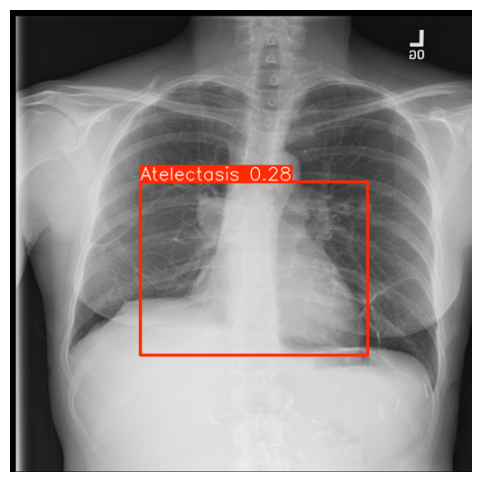


image 1/1 /content/chestXray8_512/val/images/00017611_002.png: 512x512 4 Atelectasiss, 3 Infiltrates, 11.1ms
Speed: 1.6ms preprocess, 11.1ms inference, 1.9ms postprocess per image at shape (1, 3, 512, 512)


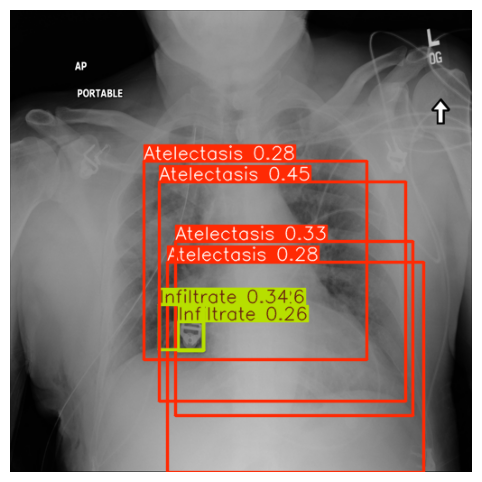


image 1/1 /content/chestXray8_512/val/images/00012048_007.png: 512x512 2 Atelectasiss, 11.1ms
Speed: 1.7ms preprocess, 11.1ms inference, 1.8ms postprocess per image at shape (1, 3, 512, 512)


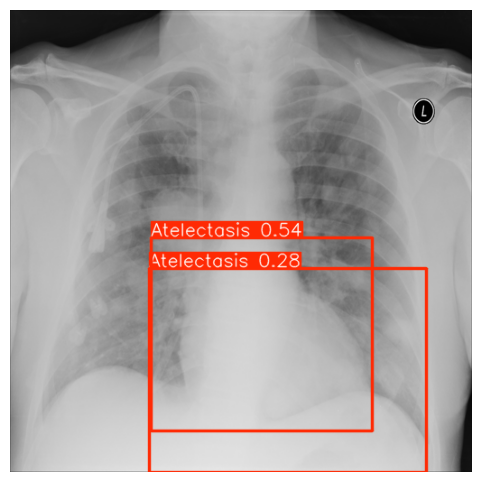


image 1/1 /content/chestXray8_512/val/images/00018102_001.png: 512x512 1 Atelectasis, 11.0ms
Speed: 1.8ms preprocess, 11.0ms inference, 1.9ms postprocess per image at shape (1, 3, 512, 512)


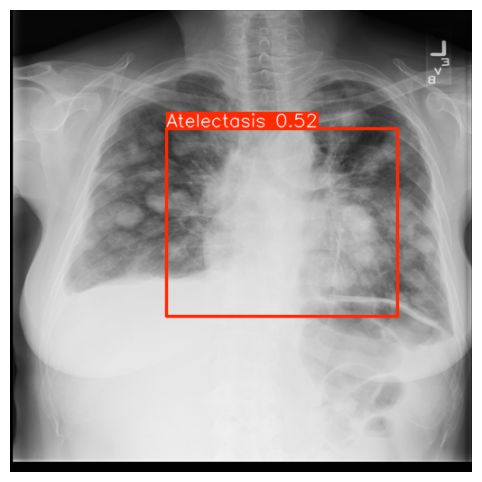


image 1/1 /content/chestXray8_512/val/images/00021009_001.png: 512x512 2 Atelectasiss, 11.1ms
Speed: 1.6ms preprocess, 11.1ms inference, 1.9ms postprocess per image at shape (1, 3, 512, 512)


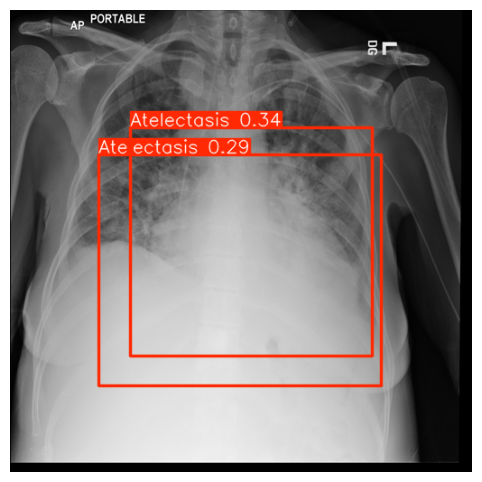


image 1/1 /content/chestXray8_512/val/images/00000050_002.png: 512x512 1 Atelectasis, 13.6ms
Speed: 1.7ms preprocess, 13.6ms inference, 1.9ms postprocess per image at shape (1, 3, 512, 512)


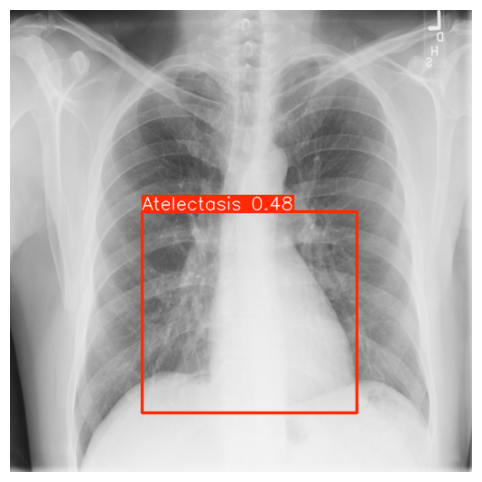


image 1/1 /content/chestXray8_512/val/images/00017514_008.png: 512x512 1 Atelectasis, 12.0ms
Speed: 1.8ms preprocess, 12.0ms inference, 2.4ms postprocess per image at shape (1, 3, 512, 512)


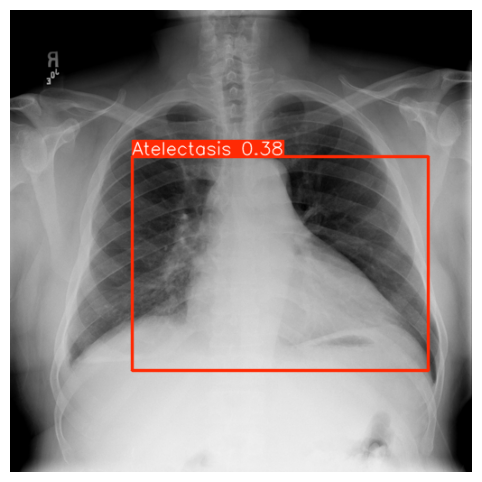


image 1/1 /content/chestXray8_512/val/images/00014738_000.png: 512x512 3 Atelectasiss, 11.1ms
Speed: 1.7ms preprocess, 11.1ms inference, 2.4ms postprocess per image at shape (1, 3, 512, 512)


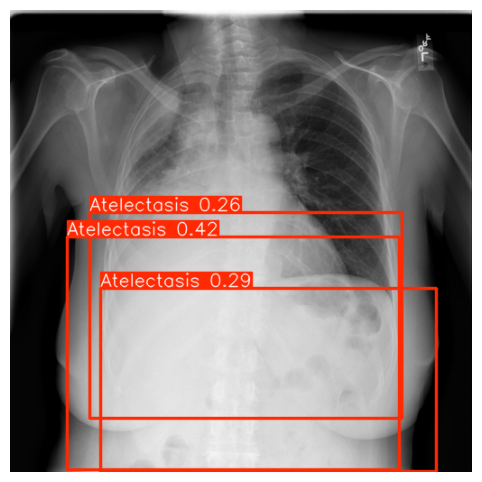


image 1/1 /content/chestXray8_512/val/images/00000050_001.png: 512x512 4 Atelectasiss, 12.9ms
Speed: 1.7ms preprocess, 12.9ms inference, 1.9ms postprocess per image at shape (1, 3, 512, 512)


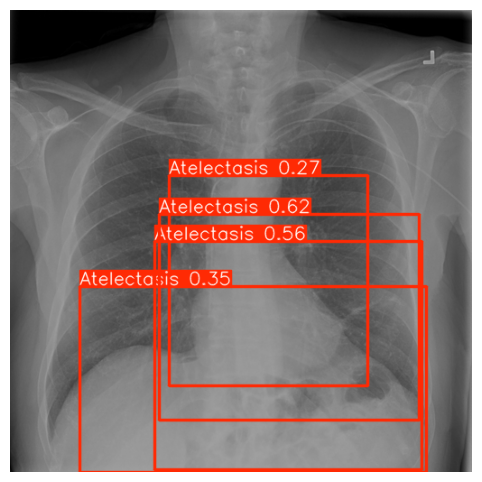


image 1/1 /content/chestXray8_512/val/images/00013051_000.png: 512x512 2 Atelectasiss, 11.1ms
Speed: 1.8ms preprocess, 11.1ms inference, 1.9ms postprocess per image at shape (1, 3, 512, 512)


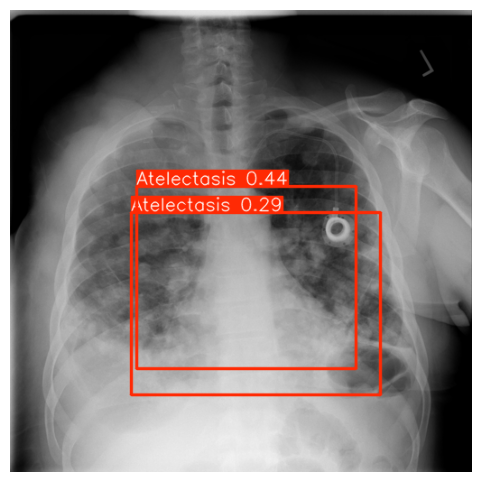


image 1/1 /content/chestXray8_512/val/images/00015058_024.png: 512x512 1 Atelectasis, 11.1ms
Speed: 1.8ms preprocess, 11.1ms inference, 1.9ms postprocess per image at shape (1, 3, 512, 512)


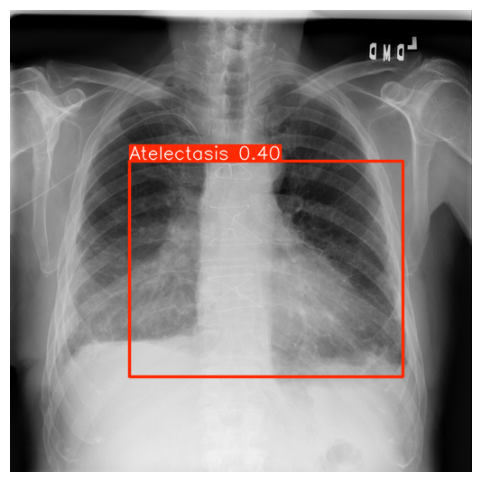


image 1/1 /content/chestXray8_512/val/images/00016184_040.png: 512x512 2 Atelectasiss, 11.1ms
Speed: 1.6ms preprocess, 11.1ms inference, 1.9ms postprocess per image at shape (1, 3, 512, 512)


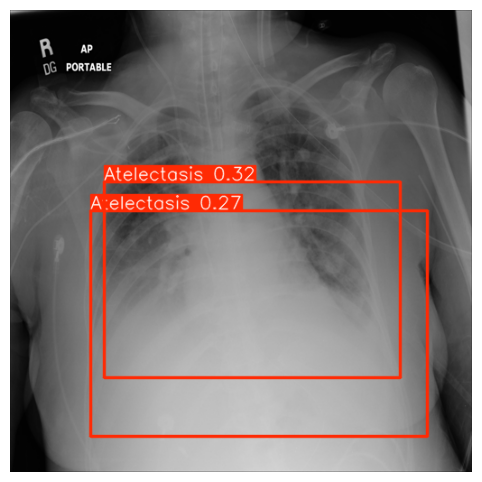


image 1/1 /content/chestXray8_512/val/images/00025252_032.png: 512x512 3 Atelectasiss, 11.1ms
Speed: 1.6ms preprocess, 11.1ms inference, 1.9ms postprocess per image at shape (1, 3, 512, 512)


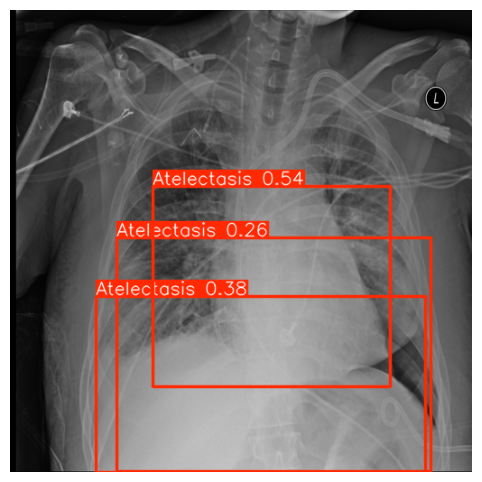


image 1/1 /content/chestXray8_512/val/images/00001373_009.png: 512x512 3 Atelectasiss, 11.1ms
Speed: 1.8ms preprocess, 11.1ms inference, 1.8ms postprocess per image at shape (1, 3, 512, 512)


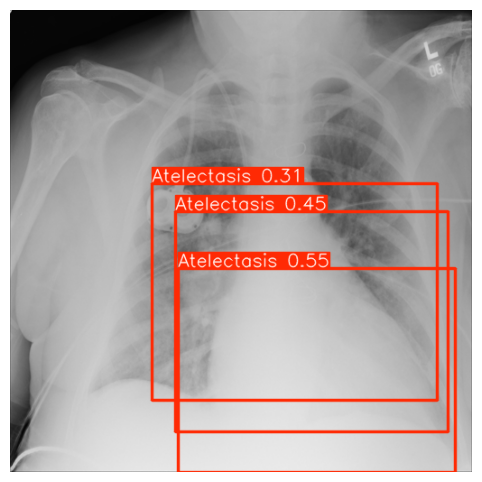


image 1/1 /content/chestXray8_512/val/images/00027464_033.png: 512x512 1 Atelectasis, 11.7ms
Speed: 1.7ms preprocess, 11.7ms inference, 1.9ms postprocess per image at shape (1, 3, 512, 512)


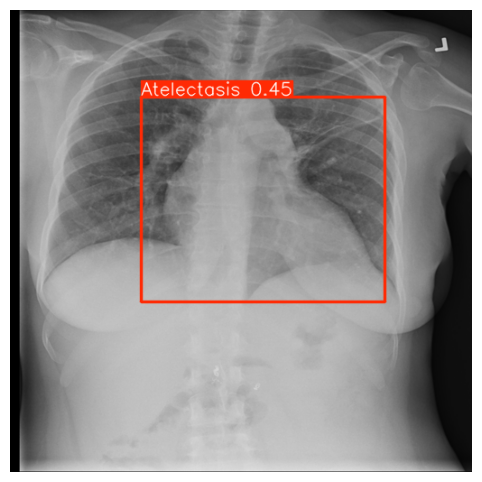


image 1/1 /content/chestXray8_512/val/images/00027866_002.png: 512x512 2 Atelectasiss, 1 Infiltrate, 12.4ms
Speed: 1.6ms preprocess, 12.4ms inference, 1.8ms postprocess per image at shape (1, 3, 512, 512)


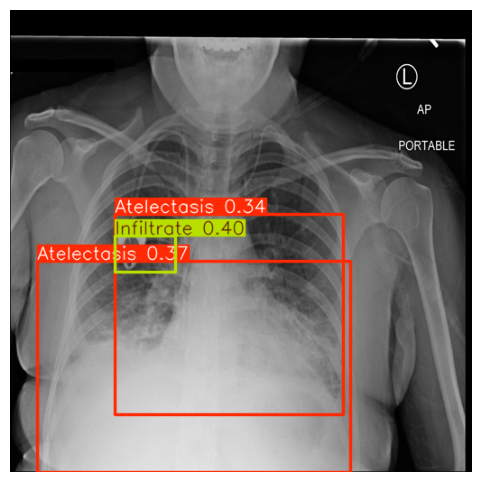


image 1/1 /content/chestXray8_512/val/images/00001534_005.png: 512x512 1 Atelectasis, 11.0ms
Speed: 1.6ms preprocess, 11.0ms inference, 2.1ms postprocess per image at shape (1, 3, 512, 512)


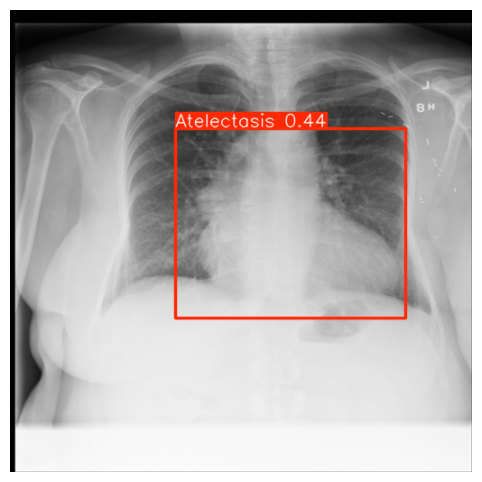


image 1/1 /content/chestXray8_512/val/images/00013635_002.png: 512x512 1 Atelectasis, 11.1ms
Speed: 1.8ms preprocess, 11.1ms inference, 1.9ms postprocess per image at shape (1, 3, 512, 512)


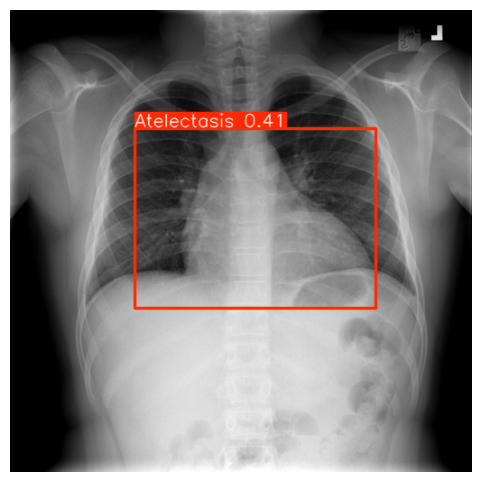


image 1/1 /content/chestXray8_512/val/images/00028974_016.png: 512x512 3 Atelectasiss, 11.1ms
Speed: 1.6ms preprocess, 11.1ms inference, 1.9ms postprocess per image at shape (1, 3, 512, 512)


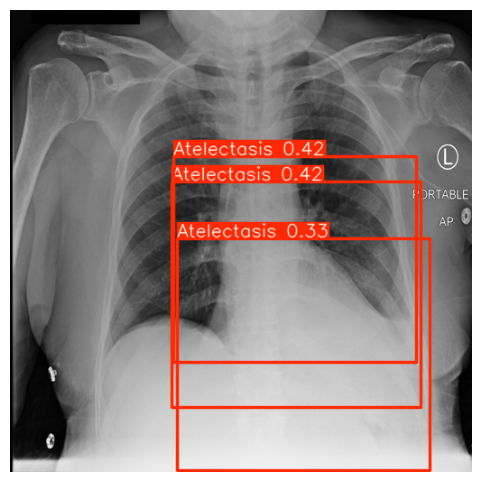


image 1/1 /content/chestXray8_512/val/images/00014795_002.png: 512x512 2 Atelectasiss, 13.5ms
Speed: 3.9ms preprocess, 13.5ms inference, 1.9ms postprocess per image at shape (1, 3, 512, 512)


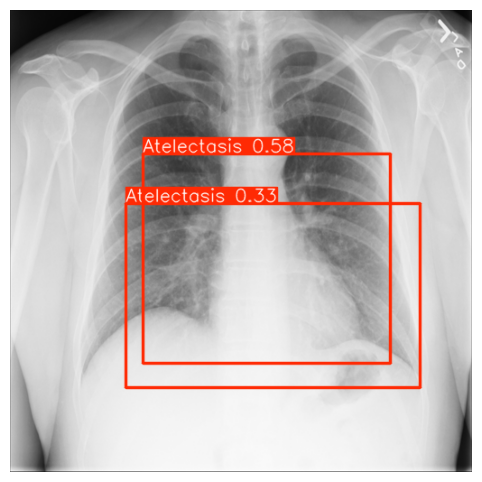


image 1/1 /content/chestXray8_512/val/images/00012299_002.png: 512x512 4 Atelectasiss, 14.8ms
Speed: 1.7ms preprocess, 14.8ms inference, 4.0ms postprocess per image at shape (1, 3, 512, 512)


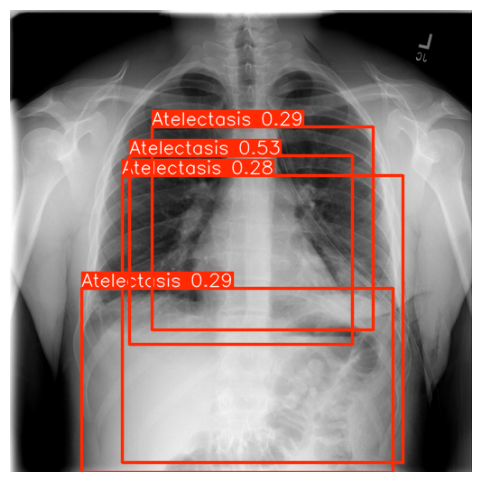


image 1/1 /content/chestXray8_512/val/images/00005532_016.png: 512x512 1 Atelectasis, 16.8ms
Speed: 1.8ms preprocess, 16.8ms inference, 2.2ms postprocess per image at shape (1, 3, 512, 512)


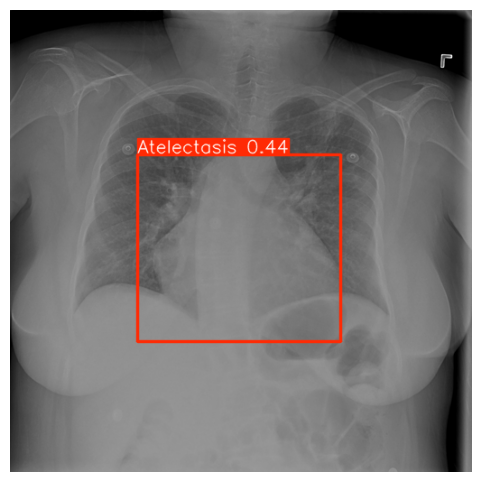


image 1/1 /content/chestXray8_512/val/images/00004344_018.png: 512x512 2 Atelectasiss, 11.1ms
Speed: 1.8ms preprocess, 11.1ms inference, 2.4ms postprocess per image at shape (1, 3, 512, 512)


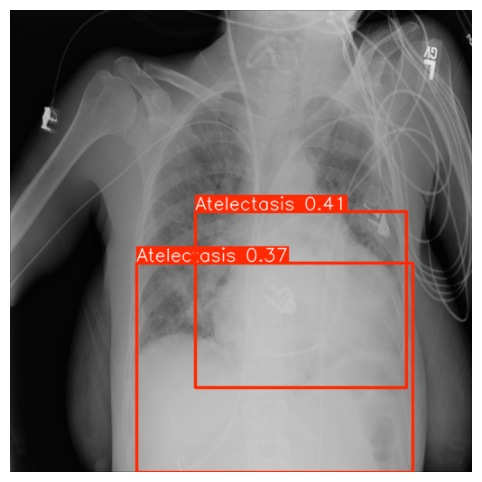


image 1/1 /content/chestXray8_512/val/images/00017028_000.png: 512x512 1 Atelectasis, 14.6ms
Speed: 1.9ms preprocess, 14.6ms inference, 2.0ms postprocess per image at shape (1, 3, 512, 512)


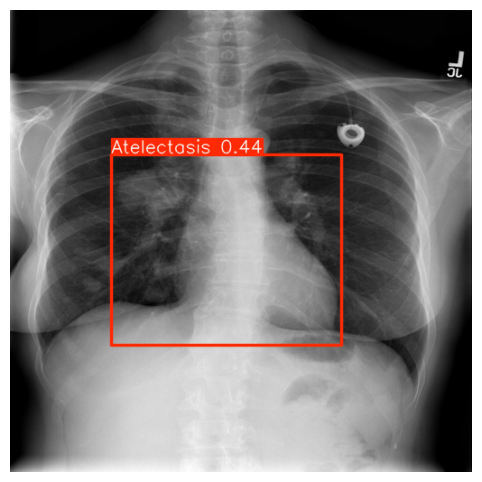


image 1/1 /content/chestXray8_512/val/images/00023176_017.png: 512x512 (no detections), 11.1ms
Speed: 1.8ms preprocess, 11.1ms inference, 0.9ms postprocess per image at shape (1, 3, 512, 512)


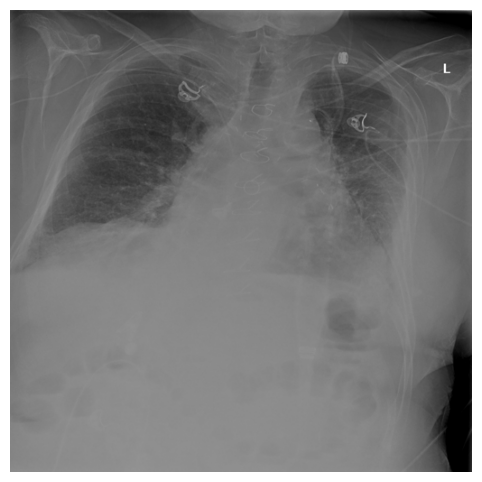


image 1/1 /content/chestXray8_512/val/images/00019399_010.png: 512x512 2 Atelectasiss, 14.0ms
Speed: 1.8ms preprocess, 14.0ms inference, 2.1ms postprocess per image at shape (1, 3, 512, 512)


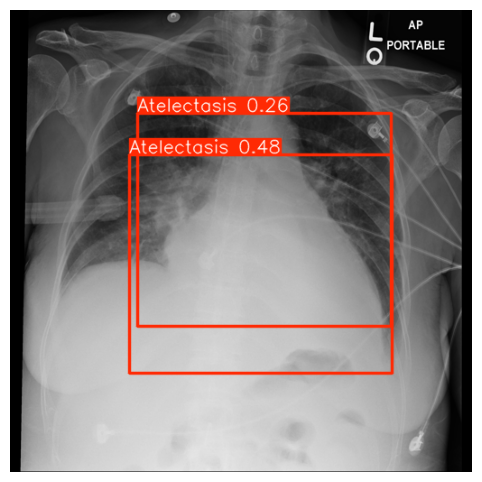


image 1/1 /content/chestXray8_512/val/images/00028330_003.png: 512x512 3 Atelectasiss, 15.2ms
Speed: 2.9ms preprocess, 15.2ms inference, 2.2ms postprocess per image at shape (1, 3, 512, 512)


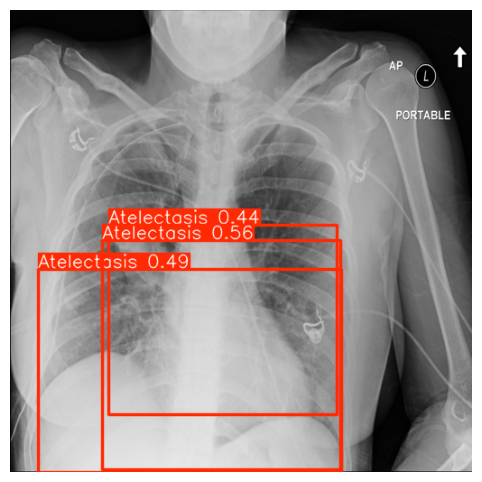


image 1/1 /content/chestXray8_512/val/images/00002106_000.png: 512x512 2 Atelectasiss, 2 Infiltrates, 16.5ms
Speed: 1.8ms preprocess, 16.5ms inference, 2.0ms postprocess per image at shape (1, 3, 512, 512)


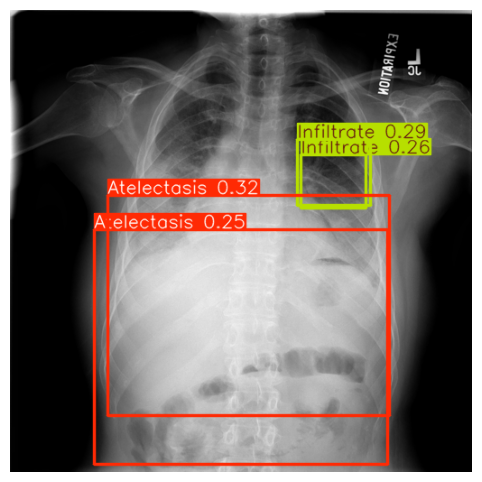


image 1/1 /content/chestXray8_512/val/images/00011322_002.png: 512x512 3 Atelectasiss, 12.2ms
Speed: 1.7ms preprocess, 12.2ms inference, 2.5ms postprocess per image at shape (1, 3, 512, 512)


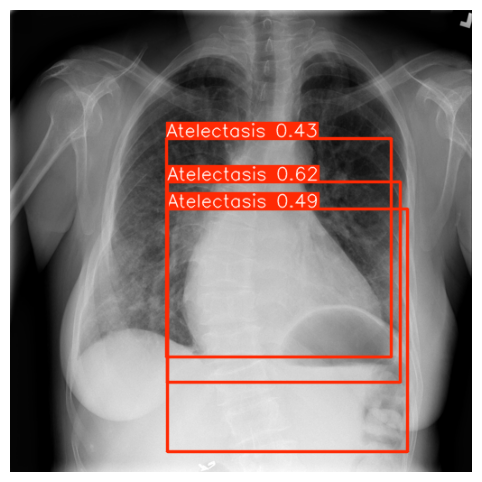

In [ ]:
image_dir = "/content/chestXray8_512/val/images"

all_images = os.listdir(image_dir)
selected_images = all_images[:50]

for img_name in selected_images:
    img_path = os.path.join(image_dir, img_name)
    results = model.predict(img_path)
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    for result in results:
        plotted_img = result.plot()
        plt.figure(figsize=(8, 6))
        plt.imshow(plotted_img)
        plt.axis('off')
        plt.show()


In [ ]:
!pip install ultralytics
!pip install google-generativeai